## Sim Demo

### Imports

In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
from env.imports import *

  import numpy.matlib as npm

  autumn = cm.get_cmap('autumn', 256)

  winter = cm.get_cmap('winter_r', 256)



In [3]:
import importlib
import data

import models
import sim.sim
import sim.sim_utils
from sim.sim_utils import bytes2human, print_system_usage
from sim.sim import Simulation
from sim.sim_run import single_sim_run

importlib.reload(sim.sim)
importlib.reload(sim.sim_run)
importlib.reload(models.train_val)
importlib.reload(data.data_utils)


<module 'data.data_utils' from '/scratch/asr655/neuroinformatics/GeneEx2Conn/data/data_utils.py'>

#### Check job specs

In [4]:
print_system_usage()

total = psutil.disk_usage('/').total
print(bytes2human(total))

CPU Usage: 4.1%
RAM Usage: 3.4%
Available RAM: 1.4T
Total RAM: 1.5T
52.4G


In [5]:
print(os.environ.get("CUDA_VISIBLE_DEVICES"))

# Check available GPUs
print(f"Available GPUs: {torch.cuda.device_count()}")

for i in range(torch.cuda.device_count()):
    print(f"GPU {i}: {torch.cuda.get_device_name(i)} - Memory Allocated: {torch.cuda.memory_allocated(i)/1024**3:.2f} GB")


0
Available GPUs: 1
GPU 0: NVIDIA H100 80GB HBM3 - Memory Allocated: 0.00 GB


In [6]:
print("XGBoost version:", xgboost.__version__)
print("cupy version:", cp.__version__)

GPUtil.getAvailable()

# if a number is seen a GPU is available
GPUtil.getGPUs()

DEVICE_ID_LIST = GPUtil.getFirstAvailable()
DEVICE_ID = DEVICE_ID_LIST[0] # grab first element from list
if DEVICE_ID != None: 
    print('GPU found', DEVICE_ID)
    use_gpu = True

    GPUtil.showUtilization()

XGBoost version: 2.0.3
cupy version: 13.1.0
GPU found 0
| ID | GPU | MEM |
------------------
|  0 |  0% |  0% |


In [7]:
torch.cuda.is_available()

# Clear GPU memory
if torch.cuda.is_available():
    torch.cuda.empty_cache()

## Simulation tests <a id="sims"></a>

### Model Parameter Counts

#### **Linear Models**
- **PCA Bilinear:** 730  _(27 PCs)_
- **PLS Bilinear:** 101  _(10 PLS components)_
- **Bilinear Low-rank:** 73,800  _(rank 10)_
- **PLS MLP:** 158,993  _(10 PLS components, including PLS projection matrices)_
- **PCA MLP:** 47,873  _(27 PCs, 2-layer)_

---

#### **MLP and SMT Models**

#### 2-Layer Models
- **MLP:** 3,812,609
- **SMT:** 1,399,947
- **MLP w/ CLS:** 3,814,145
- **SMT w/ CLS:** 1,405,579

#### 3-Layer Models
- **MLP:** 7,723,777
- **SMT:** 2,162,315
- **MLP w/ CLS:** 7,726,849
- **SMT w/ CLS:** 2,173,067

---

### Coord MLP Parameter Counts
- **[32]:** 321
- **[64, 32]:** 2,753
- **[128, 64]:** 9,601
- **[256, 128]:** 35,685
- **[512, 256, 128]:** 169,729

In [8]:
from data.data_load import load_transcriptome, load_coords, load_connectome
# Load data
X = load_transcriptome(parcellation='S456', gene_list='0.2', sort_genes='refgenome', omit_subcortical=False)
coords = load_coords(parcellation='S456', omit_subcortical=False)
Y = load_connectome(parcellation='S456', dataset='UKBB', measure='FC', omit_subcortical=False)

# Remove rows that are all NaN
valid_indices = ~np.isnan(X).all(axis=1)

# Subset data using valid indices
X = X[valid_indices]
coords = coords[valid_indices]
Y = Y[valid_indices][:, valid_indices]

# Compute pairwise distances between coordinates
n_regions = len(coords)
distances = np.zeros((n_regions, n_regions))
for i in range(n_regions):
    for j in range(n_regions):
        distances[i,j] = np.sqrt(np.sum((coords[i] - coords[j])**2))

# Compute Gaussian kernel matrix
sigma = np.median(distances)  # Use median distance as kernel width
gaussian_kernel = np.exp(-distances**2 / (2*sigma**2))


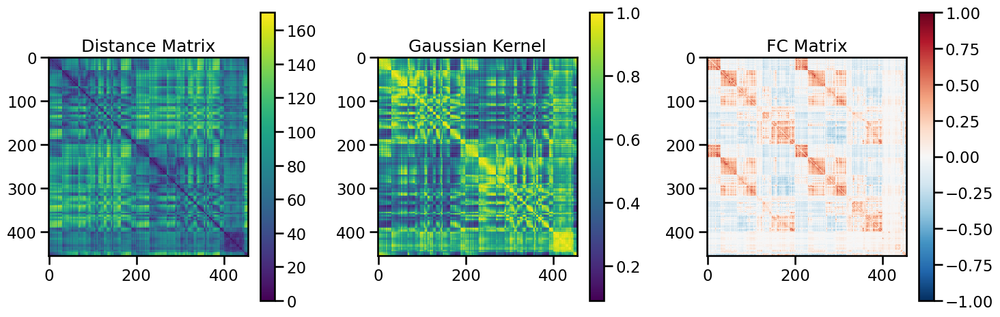

In [9]:
# Plot distance matrix, gaussian kernel, and FC matrix
fig, axes = plt.subplots(1, 3, figsize=(15, 5))

# Plot distance matrix
im0 = axes[0].imshow(distances, cmap='viridis')
axes[0].set_title('Distance Matrix')
plt.colorbar(im0, ax=axes[0])

# Plot gaussian kernel matrix 
im1 = axes[1].imshow(gaussian_kernel, cmap='viridis')
axes[1].set_title('Gaussian Kernel')
plt.colorbar(im1, ax=axes[1])

# Plot FC matrix
im2 = axes[2].imshow(Y, cmap='RdBu_r', vmin=-1, vmax=1)
axes[2].set_title('FC Matrix') 
plt.colorbar(im2, ax=axes[2])

plt.tight_layout()
plt.show()


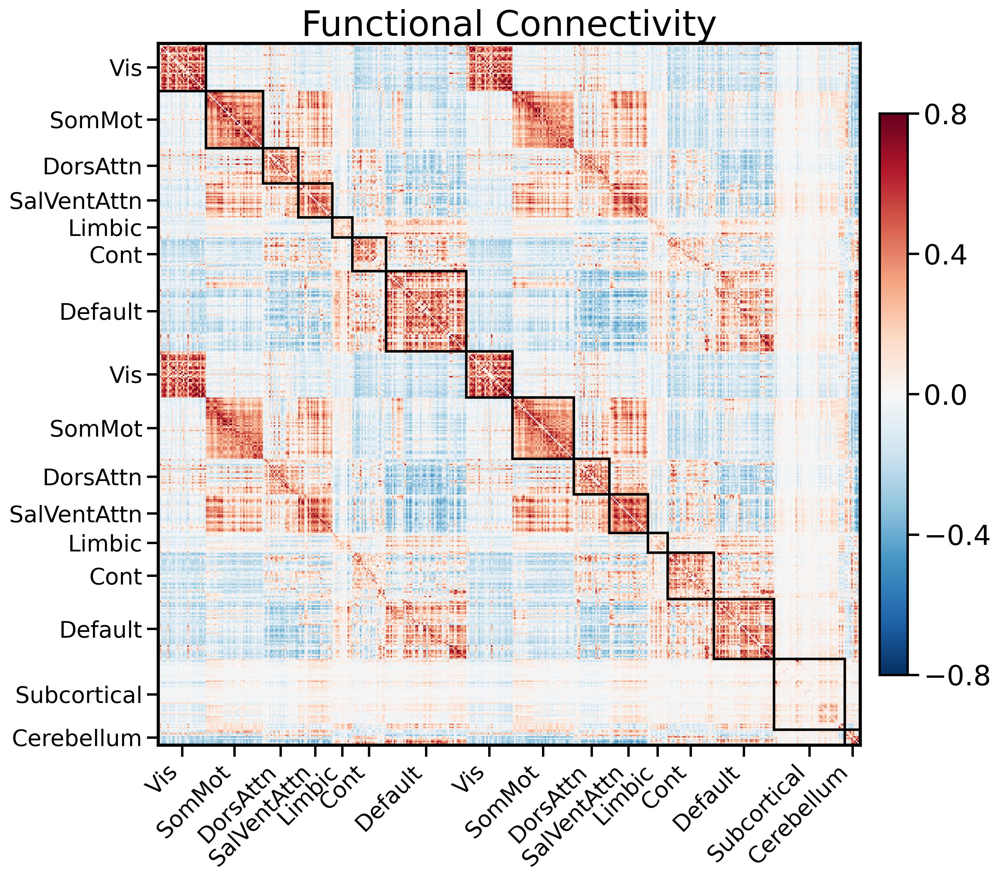

In [10]:
# Import plotting function
from data.data_viz import plot_connectome

# Plot connectome with network labels
plot_connectome(
    parcellation='S456',
    dataset='UKBB', 
    measure='FC',
    omit_subcortical=False,
    add_subnetwork_boxes=True,
    add_subnetwork_labels=True,
    fontsize=24,
    figsize=(12, 10)
)


In [23]:
# Visual system has high intra and inter-hemispheric spatial proximity - it also has strong connectivity in general
# The CLS token should be very informative here in both the true and null case
# Control on the other hand has diverse connections and spread out distances

Number of components for 95% variance PCA: 27
Number of 1s: 36662, Number of 0s: 171274, Class balance (1s): 0.176
Number of 1s: 17738, Number of 0s: 190198, Class balance (1s): 0.085
X shape: (455, 7380)
X_pca shape: (455, 27)
X_pca_full shape: (455, 455)
X_cell_types_Jorstad shape: (455, 24)
X_cell_types_LakeDFC shape: (455, 18)
X_cell_types_LakeVIS shape: (455, 18)
Y_sc shape: (455, 455)
Y_sc_spectralL shape: (455, 455)
Y_sc_spectralA shape: (455, 456)
Y_fc shape: (455, 455)
Coordinates shape: (455, 3)
Y shape (455, 455)
Network coverage: 100.0% of regions
Network sizes: {'Vis': 61, 'SomMot': 77, 'DorsAttn': 46, 'SalVentAttn': 47, 'Limbic': 26, 'Cont': 52, 'Default': 91, 'Subcortical': 46, 'Cerebellum': 9}
feature_name: euclidean, processing_type: None
features ['euclidean']
Feature matrix, X, generated... expanding to pairwise dataset


wandb: WARNING Malformed sweep config detected! This may cause your sweep to behave in unexpected ways.
wandb: WARNING To avoid this, please fix the sweep config schema violations below:
wandb: WARNING   Violation 1. Additional properties are not allowed ('best_parameters' was unexpected)


Create sweep with ID: hcgzxovo
Sweep URL: https://wandb.ai/alexander-ratzan-new-york-university/gx2conn/sweeps/hcgzxovo
Initialized sweep with ID: hcgzxovo
Testing network: Vis
SomMot
DorsAttn
SalVentAttn
Limbic
Cont
Default
Subcortical
Cerebellum
BEST CONFIG {'input_dim': 6}
Optimized sigma: 12.025
Running train evaluation...

=== TRAIN EVALUATION ===
Evaluating 394 regions, 154842 connections


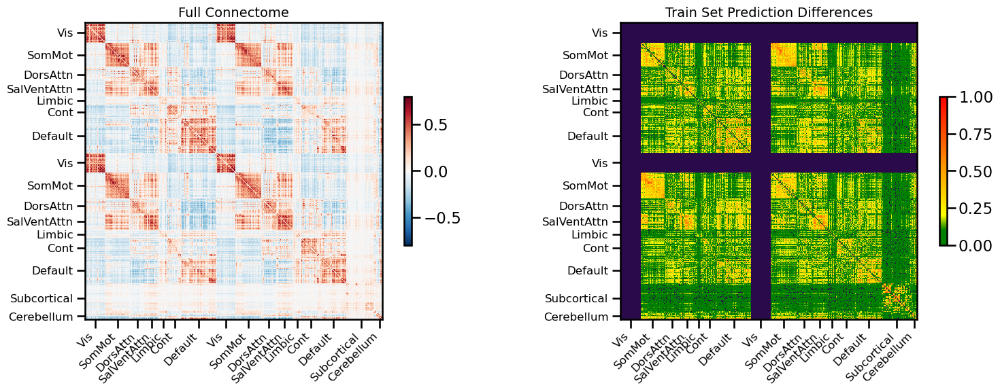

<Figure size 640x480 with 0 Axes>

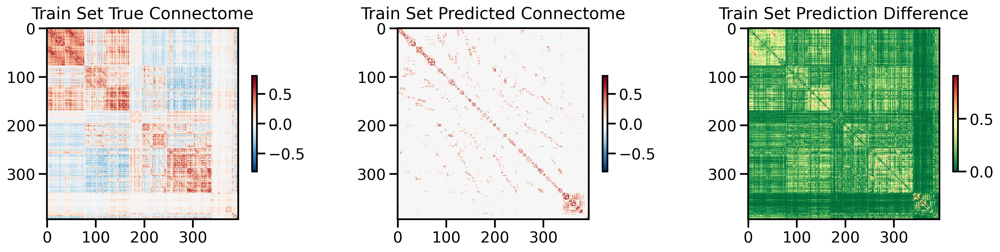

<Figure size 640x480 with 0 Axes>

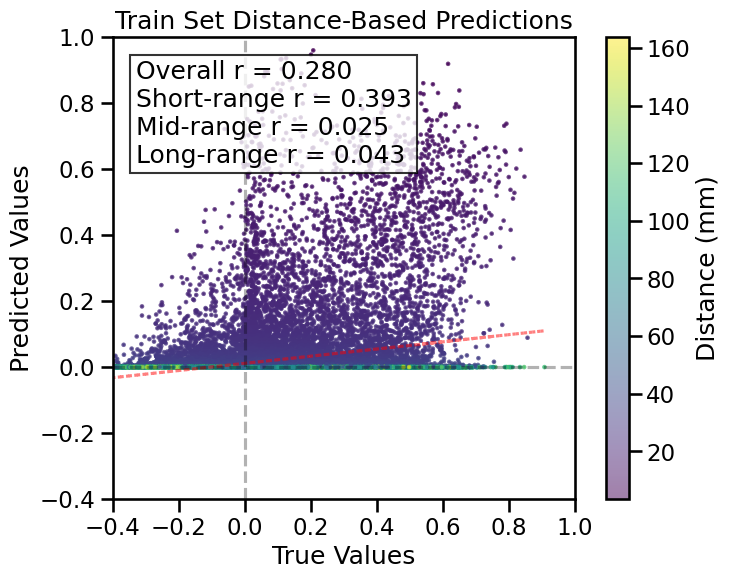

Running test evaluation...

=== TEST EVALUATION ===
Evaluating 61 regions, 3660 connections


<Figure size 640x480 with 0 Axes>

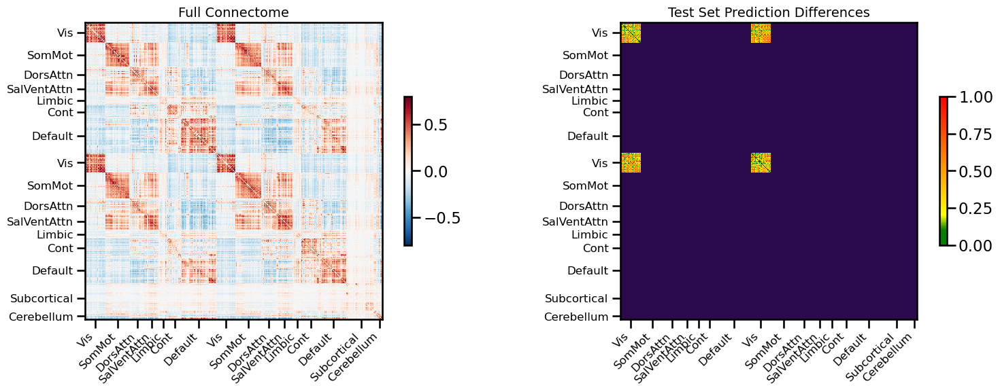

<Figure size 640x480 with 0 Axes>

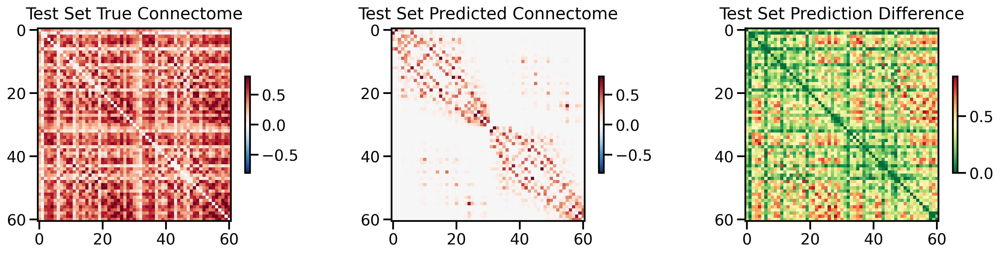

<Figure size 640x480 with 0 Axes>

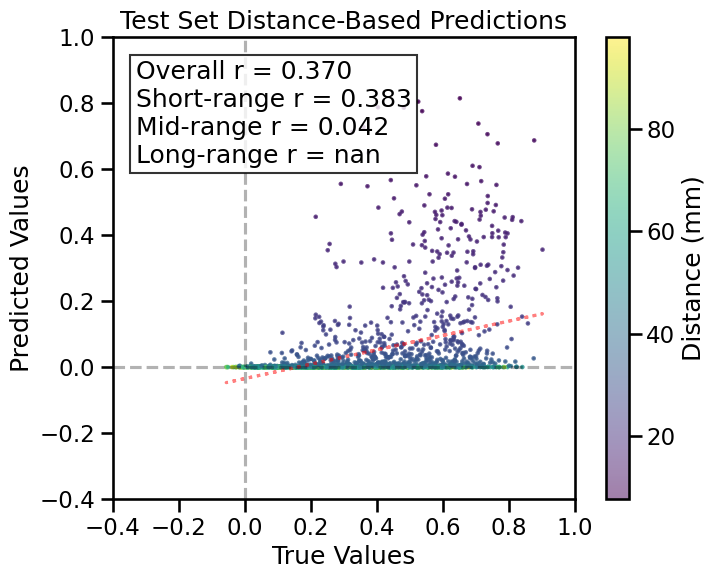

TRAIN METRICS
GLOBAL: mse=0.032564, mae=0.133417, r2=0.0576, pearson_r=0.2804, spearman_r=0.2142, geodesic_distance=26.3556
DISTANCE-BASED: short=0.3925, mid=0.0253, long=0.0432
HEMISPHERIC: left=0.3326, right=0.3605, inter=0.1500
CONNECTION STRENGTH: neg=0.0623, weak=0.1237, pos=0.3430
NETWORK CORRELATIONS:
  NETWORK      INTRA      INTER
  ------------------------------
  Cont          0.2753    0.3211
  Default       0.2937    0.3323
  SalVentAttn    0.3564    0.3519
  Limbic        0.2189    0.3029
  DorsAttn      0.3828    0.3383
  SomMot        0.3886    0.2861
  Subcortical    0.3437    0.3366
  Cerebellum    0.3837    0.2918

TEST METRICS
GLOBAL: mse=0.152173, mae=0.341240, r2=-2.5639, pearson_r=0.3697, spearman_r=0.4142, geodesic_distance=8.6708
DISTANCE-BASED: short=0.3831, mid=0.0420
HEMISPHERIC: left=0.4868, right=0.4922, inter=0.3235
CONNECTION STRENGTH: weak=0.1888, pos=0.3227
NETWORK CORRELATIONS:
  NETWORK      INTRA      INTER
  ------------------------------
  Vis    

0

<Figure size 640x480 with 0 Axes>

In [12]:
single_sim_run(
              feature_type=[{'euclidean': None}],
              train_shared_regions=False,
              test_shared_regions=False,
              omit_subcortical=False,
              dataset='UKBB',
              parcellation='S456',
              hemisphere='both',
              connectome_target='FC',
              impute_strategy='mirror_interpolate',
              sort_genes='refgenome',
              gene_list='0.2',
              cv_type='schaefer',
              random_seed=42,
              search_method=('wandb', 'mse', 4),
              track_wandb=False,
              skip_cv=True,
              model_type='gaussian_kernel',
              use_gpu=True,
              null_model='none',
              use_folds=[0]
              )

# Clear GPU memory
if torch.cuda.is_available():
    torch.cuda.empty_cache()

# Clear CPU memory
gc.collect()

Number of components for 95% variance PCA: 27
Number of 1s: 36662, Number of 0s: 171274, Class balance (1s): 0.176
Number of 1s: 17738, Number of 0s: 190198, Class balance (1s): 0.085
X shape: (455, 7380)
X_pca shape: (455, 27)
X_pca_full shape: (455, 455)
X_cell_types_Jorstad shape: (455, 24)
X_cell_types_LakeDFC shape: (455, 18)
X_cell_types_LakeVIS shape: (455, 18)
Y_sc shape: (455, 455)
Y_sc_spectralL shape: (455, 455)
Y_sc_spectralA shape: (455, 456)
Y_fc shape: (455, 455)
Coordinates shape: (455, 3)
Y shape (455, 455)
Network coverage: 100.0% of regions
Network sizes: {'Vis': 61, 'SomMot': 77, 'DorsAttn': 46, 'SalVentAttn': 47, 'Limbic': 26, 'Cont': 52, 'Default': 91, 'Subcortical': 46, 'Cerebellum': 9}
feature_name: euclidean, processing_type: None
features ['euclidean']
Feature matrix, X, generated... expanding to pairwise dataset


wandb: WARNING Malformed sweep config detected! This may cause your sweep to behave in unexpected ways.
wandb: WARNING To avoid this, please fix the sweep config schema violations below:
wandb: WARNING   Violation 1. Additional properties are not allowed ('best_parameters' was unexpected)


Create sweep with ID: 3wyoiplt
Sweep URL: https://wandb.ai/alexander-ratzan-new-york-university/gx2conn/sweeps/3wyoiplt
Initialized sweep with ID: 3wyoiplt
Testing network: Vis
SomMot
DorsAttn
SalVentAttn
Limbic
Cont
Default
Subcortical
Cerebellum
BEST CONFIG {'input_dim': 6, 'SA_inf': 0.0, 'SA_lambda': 10.0}
Optimized parameters: SA_inf=0.007 SA_lambda=14.057
Running train evaluation...

=== TRAIN EVALUATION ===
Evaluating 394 regions, 154842 connections


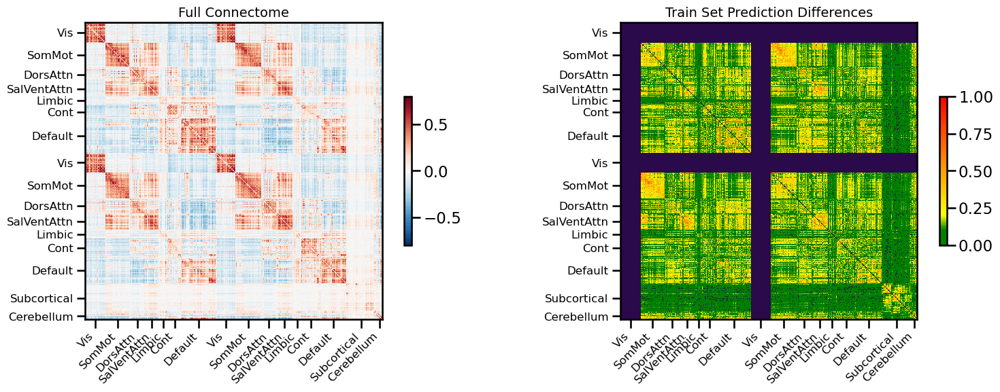

<Figure size 640x480 with 0 Axes>

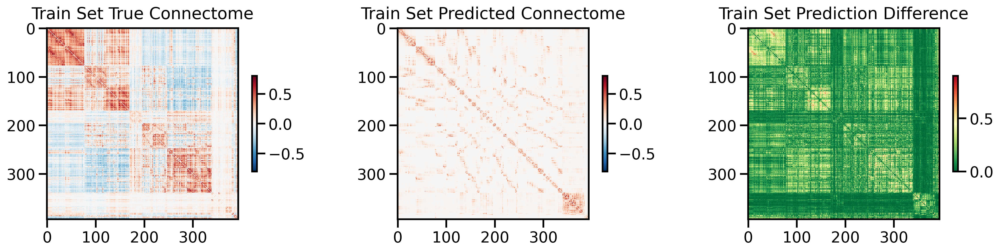

<Figure size 640x480 with 0 Axes>

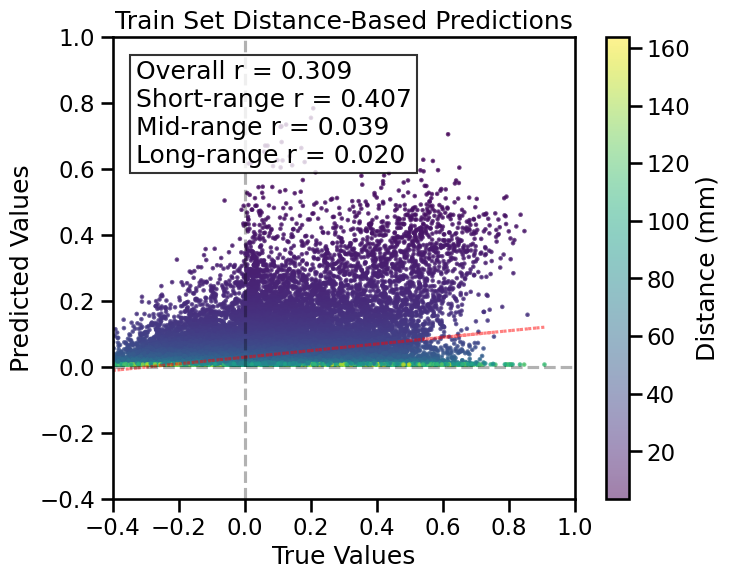

Running test evaluation...

=== TEST EVALUATION ===
Evaluating 61 regions, 3660 connections


<Figure size 640x480 with 0 Axes>

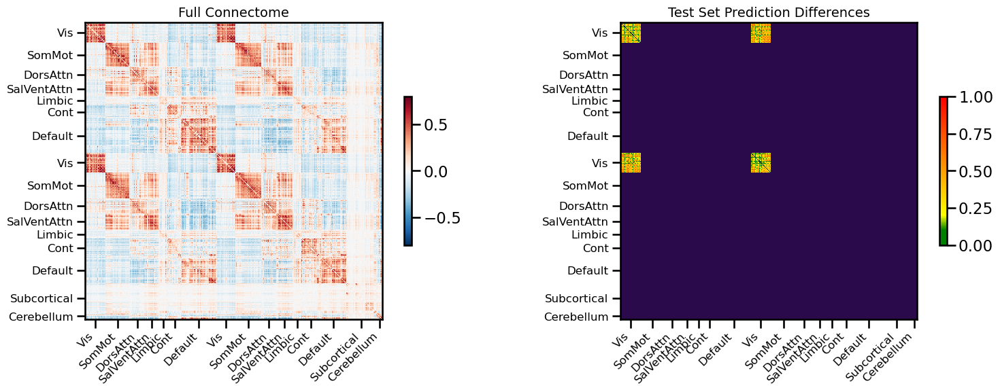

<Figure size 640x480 with 0 Axes>

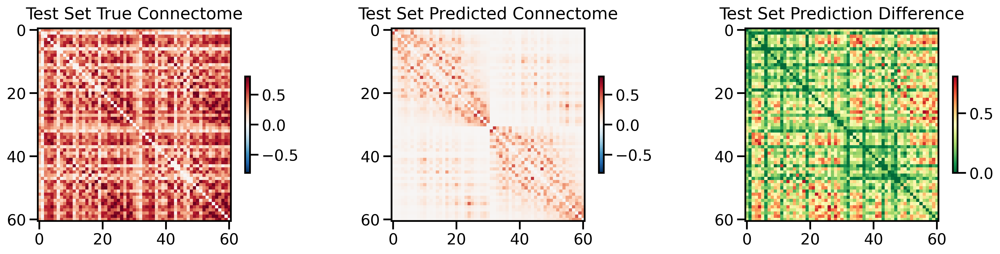

<Figure size 640x480 with 0 Axes>

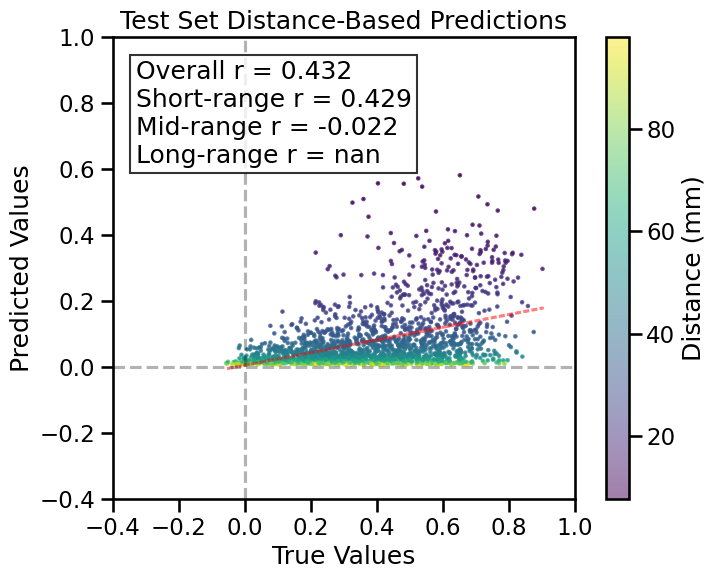

TRAIN METRICS
GLOBAL: mse=0.031260, mae=0.132381, r2=0.0953, pearson_r=0.3091, spearman_r=0.2142, geodesic_distance=26.1861
DISTANCE-BASED: short=0.4071, mid=0.0391, long=0.0204
HEMISPHERIC: left=0.3526, right=0.3846, inter=0.1938
CONNECTION STRENGTH: neg=0.1098, weak=0.1647, pos=0.3394
NETWORK CORRELATIONS:
  NETWORK      INTRA      INTER
  ------------------------------
  Cont          0.2521    0.3429
  Default       0.3535    0.3718
  SalVentAttn    0.4118    0.3773
  Limbic        0.2855    0.3017
  DorsAttn      0.3827    0.3834
  SomMot        0.4355    0.3025
  Subcortical    0.3642    0.3746
  Cerebellum    0.4993    0.3413

TEST METRICS
GLOBAL: mse=0.128415, mae=0.308876, r2=-2.0075, pearson_r=0.4319, spearman_r=0.4142, geodesic_distance=9.1625
DISTANCE-BASED: short=0.4294, mid=-0.0217
HEMISPHERIC: left=0.5453, right=0.5526, inter=0.4606
CONNECTION STRENGTH: weak=0.2802, pos=0.3437
NETWORK CORRELATIONS:
  NETWORK      INTRA      INTER
  ------------------------------
  Vis   

0

<Figure size 640x480 with 0 Axes>

In [13]:
single_sim_run(
              feature_type=[{'euclidean': None}],
              train_shared_regions=False,
              test_shared_regions=False,
              omit_subcortical=False,
              dataset='UKBB',
              parcellation='S456',
              hemisphere='both',
              connectome_target='FC',
              impute_strategy='mirror_interpolate',
              sort_genes='refgenome',
              gene_list='0.2',
              cv_type='schaefer',
              random_seed=42,
              search_method=('wandb', 'mse', 4),
              track_wandb=False,
              skip_cv=True,
              model_type='exponential_decay',
              use_gpu=True,
              null_model='none',
              use_folds=[0]
              )

# Clear GPU memory
if torch.cuda.is_available():
    torch.cuda.empty_cache()

# Clear CPU memory
gc.collect()

Number of components for 95% variance PCA: 27
Number of 1s: 36662, Number of 0s: 171274, Class balance (1s): 0.176
Number of 1s: 17738, Number of 0s: 190198, Class balance (1s): 0.085
X shape: (455, 7380)
X_pca shape: (455, 27)
X_pca_full shape: (455, 455)
X_cell_types_Jorstad shape: (455, 24)
X_cell_types_LakeDFC shape: (455, 18)
X_cell_types_LakeVIS shape: (455, 18)
Y_sc shape: (455, 455)
Y_sc_spectralL shape: (455, 455)
Y_sc_spectralA shape: (455, 456)
Y_fc shape: (455, 455)
Coordinates shape: (455, 3)
Y shape (455, 455)
Network coverage: 100.0% of regions
Network sizes: {'Vis': 61, 'SomMot': 77, 'DorsAttn': 46, 'SalVentAttn': 47, 'Limbic': 26, 'Cont': 52, 'Default': 91, 'Subcortical': 46, 'Cerebellum': 9}
feature_name: transcriptome, processing_type: None
features ['transcriptome']
Feature matrix, X, generated... expanding to pairwise dataset


wandb: WARNING Malformed sweep config detected! This may cause your sweep to behave in unexpected ways.
wandb: WARNING To avoid this, please fix the sweep config schema violations below:
wandb: WARNING   Violation 1. Additional properties are not allowed ('best_parameters' was unexpected)


Create sweep with ID: n01wvwy1
Sweep URL: https://wandb.ai/alexander-ratzan-new-york-university/gx2conn/sweeps/n01wvwy1
Initialized sweep with ID: n01wvwy1


  warnings.warn(



Testing network: Vis
SomMot
DorsAttn
SalVentAttn
Limbic
Cont
Default
Subcortical
Cerebellum
BEST CONFIG {'input_dim': 14760, 'token_encoder_dim': 20, 'd_model': 128, 'use_alibi': True, 'nhead': 4, 'num_layers': 4, 'deep_hidden_dims': [512, 256, 128], 'transformer_dropout': 0.1, 'dropout_rate': 0.1, 'learning_rate': 0.0007, 'weight_decay': 1e-05, 'batch_size': 1024, 'aug_prob': 0.0, 'epochs': 110, 'num_workers': 2, 'prefetch_factor': 4}
Number of learnable parameters in SMT model: 1064706
Using device: cuda
GPU 0: NVIDIA H100 80GB HBM3 - Memory Allocated: 0.21 GB
Best val loss so far at epoch 1: 0.1465
Best val loss so far at epoch 2: 0.0991
Best val loss so far at epoch 5: 0.0868
Epoch 5/110, Train Loss: 0.0145, Val Loss: 0.0868, Time: 11.19s
Best val loss so far at epoch 8: 0.0579
Epoch 10/110, Train Loss: 0.0062, Val Loss: 0.0745, Time: 11.25s
Best val loss so far at epoch 13: 0.0505
Epoch 15/110, Train Loss: 0.0039, Val Loss: 0.1008, Time: 11.21s
Epoch 20/110, Train Loss: 0.0029, Va

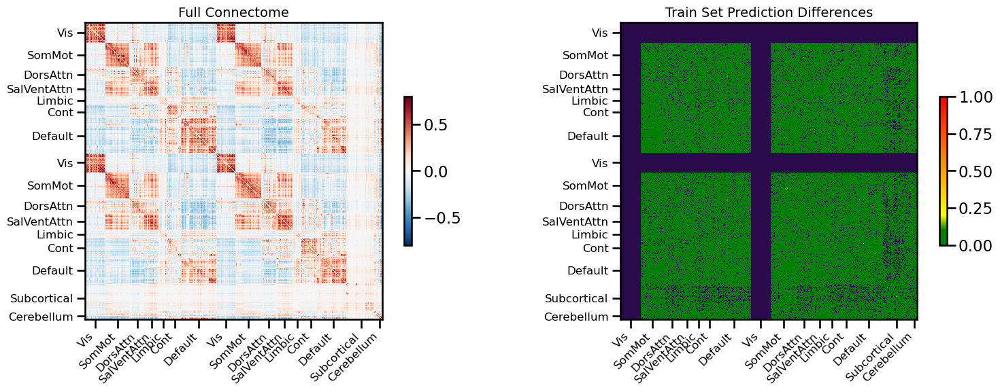

<Figure size 640x480 with 0 Axes>

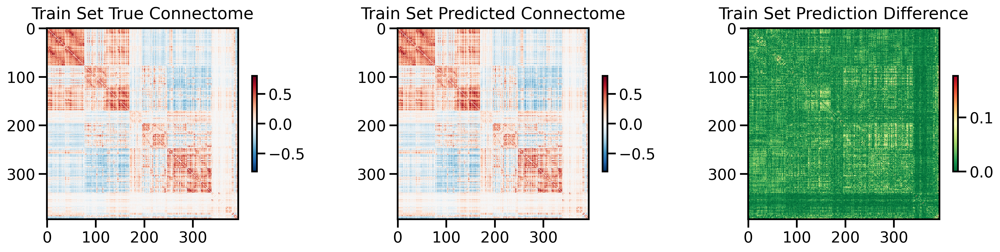

<Figure size 640x480 with 0 Axes>

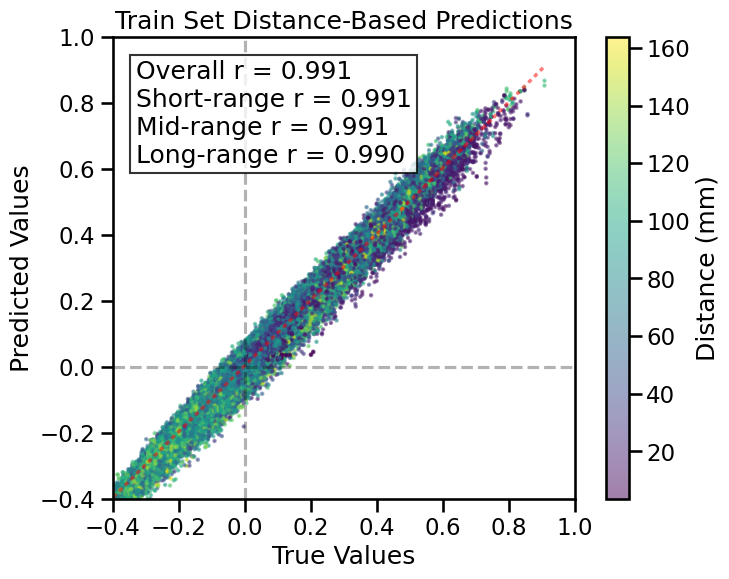

Running test evaluation...

=== TEST EVALUATION ===
Evaluating 61 regions, 3660 connections


<Figure size 640x480 with 0 Axes>

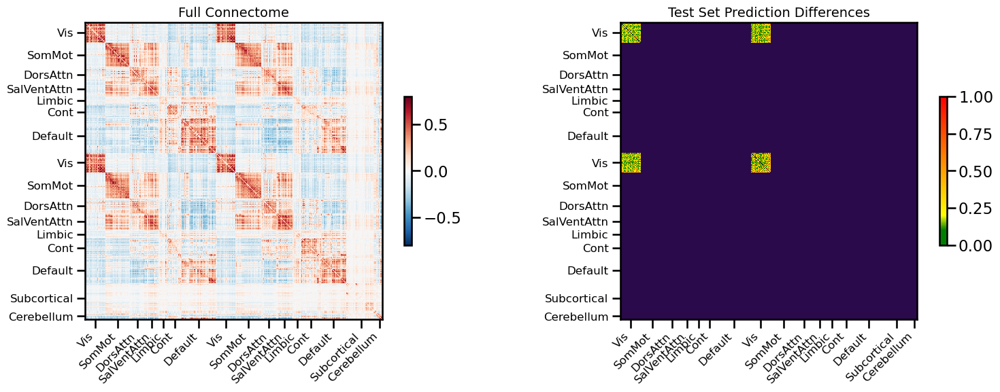

<Figure size 640x480 with 0 Axes>

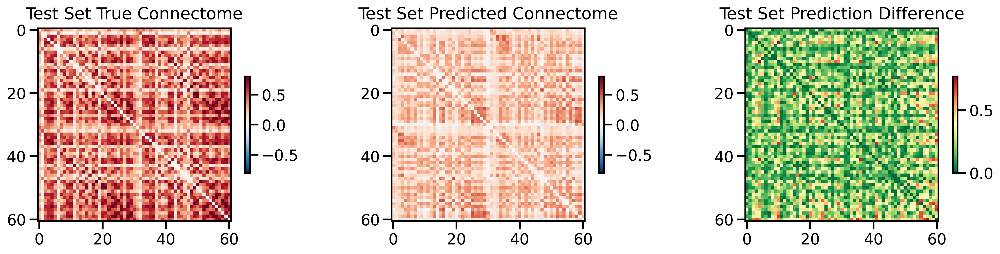

<Figure size 640x480 with 0 Axes>

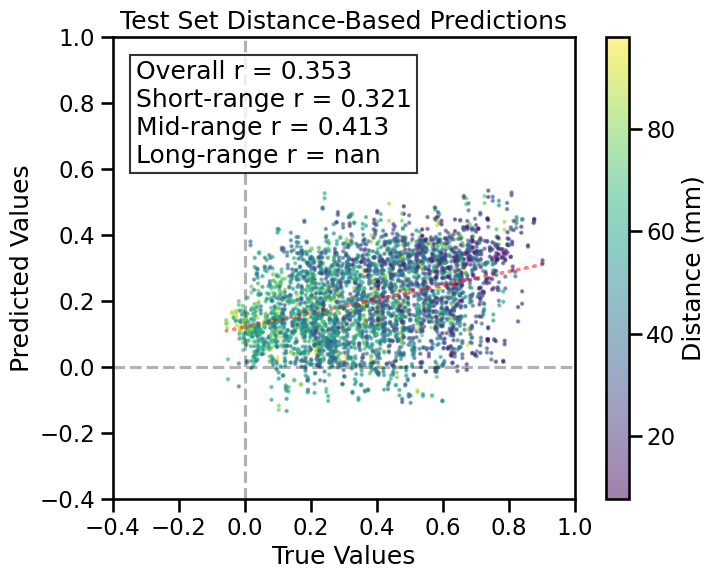

TRAIN METRICS
GLOBAL: mse=0.000670, mae=0.019735, r2=0.9806, pearson_r=0.9907, spearman_r=0.9879, geodesic_distance=13.4366
DISTANCE-BASED: short=0.9906, mid=0.9905, long=0.9898
HEMISPHERIC: left=0.9905, right=0.9904, inter=0.9903
CONNECTION STRENGTH: neg=0.8638, weak=0.9828, pos=0.9443
NETWORK CORRELATIONS:
  NETWORK      INTRA      INTER
  ------------------------------
  Cont          0.9913    0.9915
  Default       0.9889    0.9916
  SalVentAttn    0.9931    0.9933
  Limbic        0.9845    0.9909
  DorsAttn      0.9940    0.9948
  SomMot        0.9949    0.9946
  Subcortical    0.9885    0.9911
  Cerebellum    0.9870    0.9896

TEST METRICS
GLOBAL: mse=0.073444, mae=0.221305, r2=-0.7201, pearson_r=0.3529, spearman_r=0.3531, geodesic_distance=7.8208
DISTANCE-BASED: short=0.3205, mid=0.4129
HEMISPHERIC: left=0.3241, right=0.3332, inter=0.3735
CONNECTION STRENGTH: weak=0.1497, pos=0.2697
NETWORK CORRELATIONS:
  NETWORK      INTRA      INTER
  ------------------------------
  Vis    

8534

<Figure size 640x480 with 0 Axes>

In [16]:
single_sim_run(
              feature_type=[{'transcriptome': None}],
              train_shared_regions=False,
              test_shared_regions=False,
              omit_subcortical=False,
              dataset='UKBB',
              parcellation='S456',
              hemisphere='both',
              connectome_target='FC',
              impute_strategy='mirror_interpolate',
              sort_genes='refgenome',
              gene_list='0.2',
              cv_type='schaefer',
              random_seed=42,
              search_method=('wandb', 'mse', 4),
              track_wandb=False,
              skip_cv=True,
              model_type='shared_transformer_pool',
              use_gpu=True,
              null_model='none',
              use_folds=[0]
              )

# Clear GPU memory
if torch.cuda.is_available():
    torch.cuda.empty_cache()

# Clear CPU memory
gc.collect()

Number of components for 95% variance PCA: 27
Number of 1s: 36662, Number of 0s: 171274, Class balance (1s): 0.176
Number of 1s: 17738, Number of 0s: 190198, Class balance (1s): 0.085
X shape: (455, 7380)
X_pca shape: (455, 27)
X_pca_full shape: (455, 455)
X_cell_types_Jorstad shape: (455, 24)
X_cell_types_LakeDFC shape: (455, 18)
X_cell_types_LakeVIS shape: (455, 18)
Y_sc shape: (455, 455)
Y_sc_spectralL shape: (455, 455)
Y_sc_spectralA shape: (455, 456)
Y_fc shape: (455, 455)
Coordinates shape: (455, 3)
Y shape (455, 455)
Network coverage: 100.0% of regions
Network sizes: {'Vis': 61, 'SomMot': 77, 'DorsAttn': 46, 'SalVentAttn': 47, 'Limbic': 26, 'Cont': 52, 'Default': 91, 'Subcortical': 46, 'Cerebellum': 9}
feature_name: transcriptome, processing_type: None
features ['transcriptome']
Feature matrix, X, generated... expanding to pairwise dataset


wandb: WARNING Malformed sweep config detected! This may cause your sweep to behave in unexpected ways.
wandb: WARNING To avoid this, please fix the sweep config schema violations below:
wandb: WARNING   Violation 1. Additional properties are not allowed ('best_parameters' was unexpected)


Create sweep with ID: fixtx327
Sweep URL: https://wandb.ai/alexander-ratzan-new-york-university/gx2conn/sweeps/fixtx327
Initialized sweep with ID: fixtx327


  warnings.warn(



Testing network: Vis
SomMot
DorsAttn
SalVentAttn
Limbic
Cont
Default
Subcortical
Cerebellum
BEST CONFIG {'input_dim': 14760, 'token_encoder_dim': 20, 'd_model': 128, 'use_alibi': True, 'nhead': 4, 'num_layers': 4, 'deep_hidden_dims': [512, 256, 128], 'cls_init': 'spatial_learned', 'transformer_dropout': 0.1, 'dropout_rate': 0.1, 'cls_dropout': 0.8, 'learning_rate': 0.0007, 'weight_decay': 1e-05, 'batch_size': 1024, 'aug_prob': 0.0, 'epochs': 110, 'num_workers': 2, 'prefetch_factor': 4}
Number of learnable parameters in SMT w/ CLS pooled model: 1081858
Using device: cuda
GPU 0: NVIDIA H100 80GB HBM3 - Memory Allocated: 0.14 GB
Best val loss so far at epoch 1: 0.1496
Best val loss so far at epoch 3: 0.1436
Best val loss so far at epoch 4: 0.1435
Epoch 5/110, Train Loss: 0.0307, Val Loss: 0.1741, Time: 11.31s
Best val loss so far at epoch 7: 0.0751
Best val loss so far at epoch 8: 0.0662
Epoch 10/110, Train Loss: 0.0252, Val Loss: 0.0675, Time: 11.42s
Epoch 15/110, Train Loss: 0.0225, Val

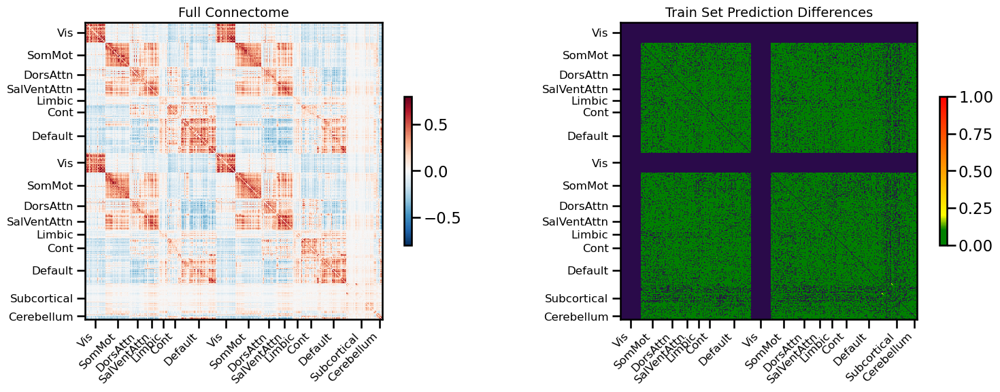

<Figure size 640x480 with 0 Axes>

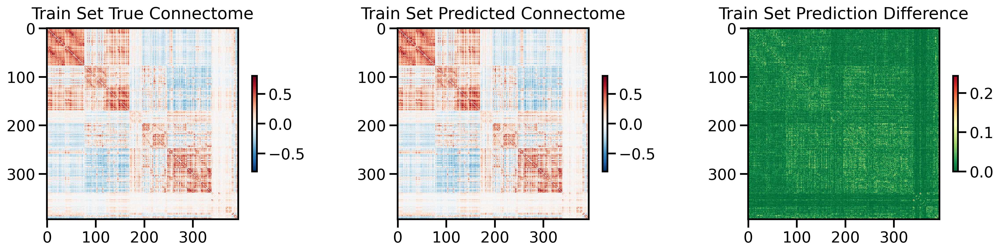

<Figure size 640x480 with 0 Axes>

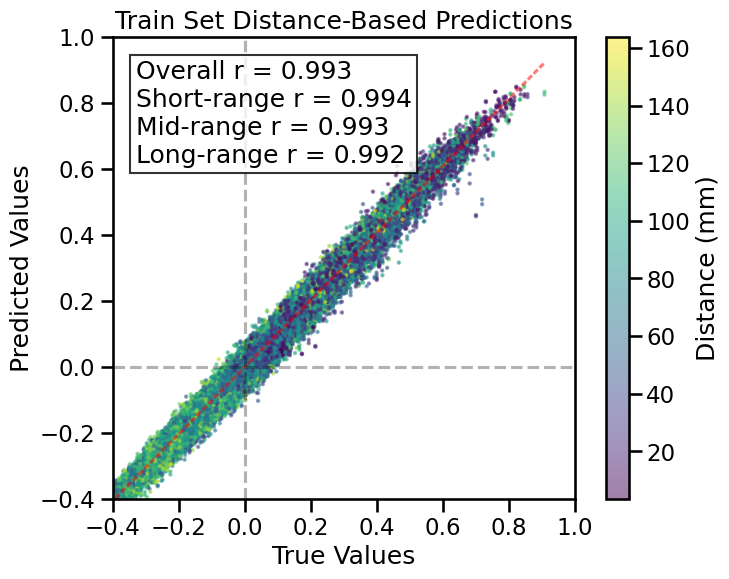

Running test evaluation...

=== TEST EVALUATION ===
Evaluating 61 regions, 3660 connections


<Figure size 640x480 with 0 Axes>

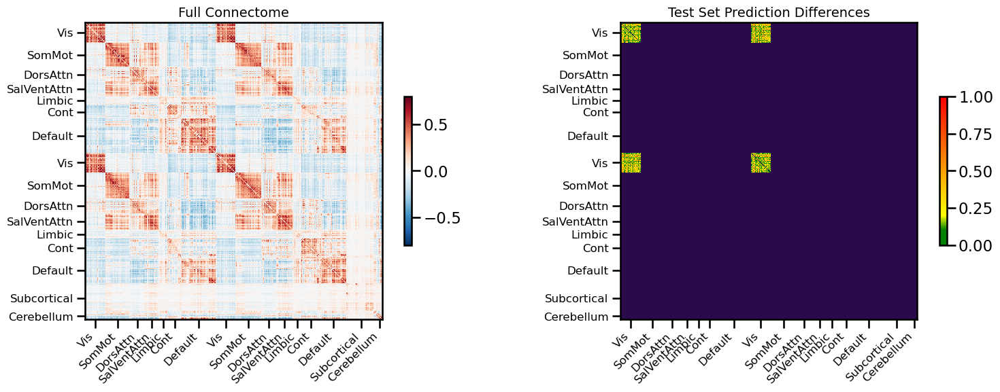

<Figure size 640x480 with 0 Axes>

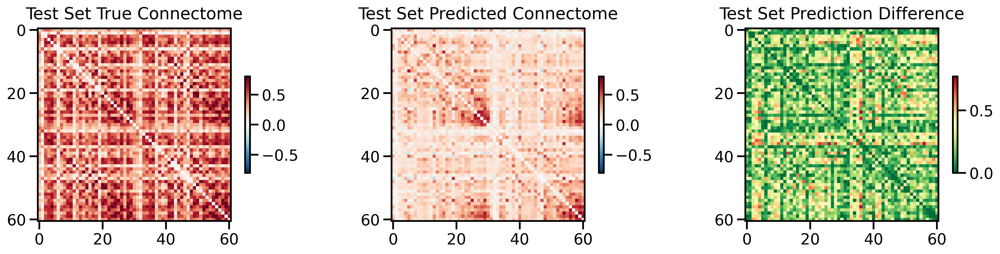

<Figure size 640x480 with 0 Axes>

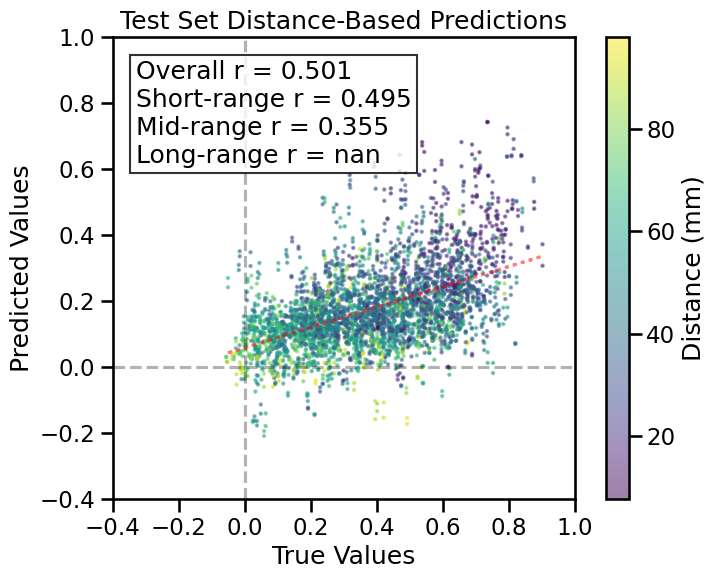

TRAIN METRICS
GLOBAL: mse=0.000498, mae=0.016654, r2=0.9856, pearson_r=0.9932, spearman_r=0.9907, geodesic_distance=14.1397
DISTANCE-BASED: short=0.9937, mid=0.9927, long=0.9921
HEMISPHERIC: left=0.9934, right=0.9940, inter=0.9929
CONNECTION STRENGTH: neg=0.8783, weak=0.9872, pos=0.9585
NETWORK CORRELATIONS:
  NETWORK      INTRA      INTER
  ------------------------------
  Cont          0.9925    0.9936
  Default       0.9916    0.9940
  SalVentAttn    0.9962    0.9949
  Limbic        0.9887    0.9930
  DorsAttn      0.9942    0.9955
  SomMot        0.9960    0.9957
  Subcortical    0.9920    0.9938
  Cerebellum    0.9751    0.9937

TEST METRICS
GLOBAL: mse=0.075946, mae=0.227233, r2=-0.7787, pearson_r=0.5009, spearman_r=0.5005, geodesic_distance=10.0128
DISTANCE-BASED: short=0.4952, mid=0.3549
HEMISPHERIC: left=0.5367, right=0.5534, inter=0.4752
CONNECTION STRENGTH: weak=0.2950, pos=0.4022
NETWORK CORRELATIONS:
  NETWORK      INTRA      INTER
  ------------------------------
  Vis   

13932

<Figure size 640x480 with 0 Axes>

In [17]:
single_sim_run(
              feature_type=[{'transcriptome': None}],
              train_shared_regions=False,
              test_shared_regions=False,
              omit_subcortical=False,
              dataset='UKBB',
              parcellation='S456',
              hemisphere='both',
              connectome_target='FC',
              impute_strategy='mirror_interpolate',
              sort_genes='refgenome',
              gene_list='0.2',
              cv_type='schaefer',
              random_seed=42,
              search_method=('wandb', 'mse', 4),
              track_wandb=False,
              skip_cv=True,
              model_type='shared_transformer_cls_pool',
              use_gpu=True,
              null_model='none',
              use_folds=[0]
              )

# Clear GPU memory
if torch.cuda.is_available():
    torch.cuda.empty_cache()

# Clear CPU memory
gc.collect()